In [1]:
try:
    import google.colab
    google.colab.drive.mount('/content/drive/')
    %cd ../content/drive/Othercomputers/Laptop/Flood_Detection
except:
    pass

In [2]:
import sys; sys.path.append('../../')
from sklearn import svm
import numpy as np
from sklearn.metrics import classification_report
from sklearn import metrics
from mlpath import mlquest as mlq
from DataPreparation.DataPreparation import read_data
from FeatureExtraction.Shufflenet.Shufflenet import apply_deep_features
from FeatureExtraction.Visuals import illustrate3DFeatures
from sklearn.metrics import classification_report
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import f1_score
from tqdm import tqdm
import albumentations.pytorch as AP
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform, uniform
mlq.start_quest("Shuffle-SVM", table_dest="../../", log_defs=True)

/opt/anaconda3/envs/M1/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/M1/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/opt/anaconda3/envs/M1/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/

### Reading and Preprocessing

In [3]:
more_transforms = [AP.transforms.ToTensorV2()]          # PyTorch deals with tensors on the GPU not numpy arrays
x_train_d, x_val_d, y_train_d, y_val_d = mlq.l(read_data)(gray=False, normalize=True, new_size=224,
                                                          more_transforms=more_transforms, saved=True)

x_train shape:  (737,)
x_val shape:  (185,)


### Feature Extraction: Deep Features (Shufflenet)

In [4]:
x_train_f, x_val_f = mlq.l(apply_deep_features)(x_train_d, x_val_d, saved=True)

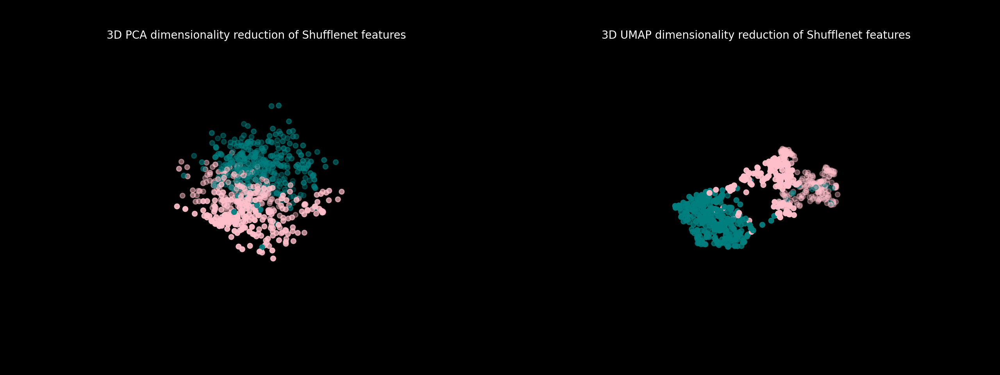

In [5]:
illustration = illustrate3DFeatures(x_train_f, y_train_d, "Shufflenet")
illustration.double_gif(animated=True, useOld=True)

### Initiating the Model

In [6]:
model = mlq.l(svm.SVC)( C=7, kernel='rbf')

In [7]:
%%script false --no-raise-error
# Hyperparameter search with RandomizedSearchCV
param_dist = {'C': loguniform(1e0, 1e5), 'gamma': loguniform(1e-5, 1e-3), 'kernel': ['rbf']}

search = RandomizedSearchCV(model, param_dist, cv=5, n_iter=200, scoring='f1', verbose=1, n_jobs=-1)
search.fit(x_train_f, y_train_d)
opt_params_rbf = search.best_params_
print("Best Score RBF: %0.3f" % search.best_score_)

### Training the Model

In [8]:
model.fit(x_train_f, y_train_d)

SVC(C=7)

### Validating the Model

In [9]:
F1 = metrics.f1_score(y_val_d, model.predict(x_val_f), average='macro').item()
Accuracy = metrics.accuracy_score(y_val_d, model.predict(x_val_f)).item()
mlq.log_metrics(Accuracy, F1)
report = classification_report(y_val_d, model.predict(x_val_f), digits=3)
print(report)

              precision    recall  f1-score   support

           0      0.978     1.000     0.989        87
           1      1.000     0.980     0.990        98

    accuracy                          0.989       185
   macro avg      0.989     0.990     0.989       185
weighted avg      0.989     0.989     0.989       185



### Error Analysis

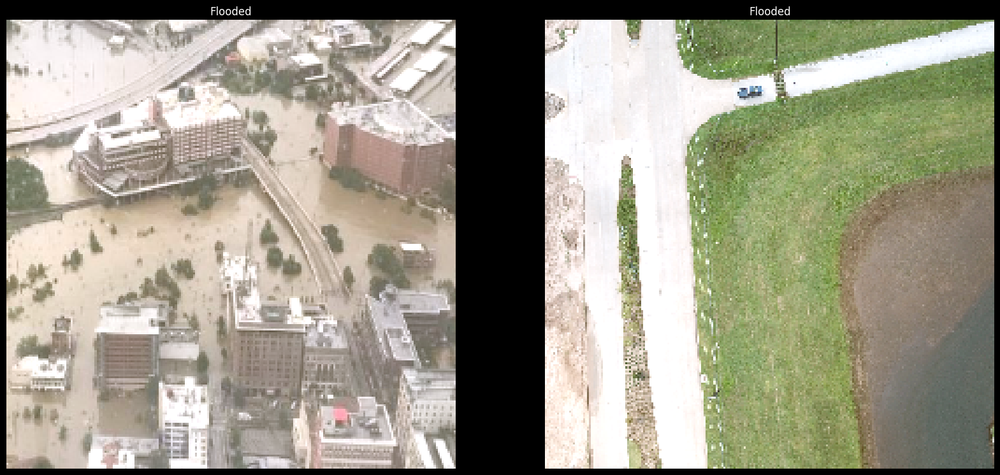

In [10]:
mistake_inds = np.where(y_val_d != model.predict(x_val_f))[0]

# Let's plot all the images with an error
import matplotlib.pyplot as plt
plt.style.use('dark_background')
import torch

# plot the miscalssified images
fig, axs = plt.subplots(1, len(mistake_inds), figsize=(20, 20))
for i, ind in enumerate(mistake_inds):
    img = x_val_d[ind].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img = np.clip(img, 0, 1)
    axs[i].imshow(img)
    # set flooded or not labels
    if y_val_d[ind] == 1:
        axs[i].set_title("Flooded")
    else:
        axs[i].set_title("Not Flooded")
    axs[i].axis('off')
plt.show()


### Tracking

In [11]:
mlq.end_quest()
mlq.show_logs(quest_name='Shuffle-SVM', table_dest='../../', last_k=5)

### Cross Validation

In [12]:
def CV_Evaluate(model, x_data, y_data):
    """
    Evaluates the performance (F1) of the given model using leave-one-out or repeated KFold cross validation.
    The fact that the function is defined here is a violation to the standards of ths project [Awaiting Fix]
    """
    mistakes_inds = []
    cval = RepeatedKFold(n_splits=20, n_repeats=20, random_state=42)
    f1_scores = []
    for i, j in tqdm(cval.split(x_data)):           # splits yields indecies of the points in the current split
        x_train, x_val = x_data[i], x_data[j]
        y_train, y_val = y_data[i], y_data[j]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_val)
        f1_scores.append(f1_score(y_val, y_pred))
    mean_f1_score = sum(f1_scores) / len(f1_scores)
    return mean_f1_score

# merge x_train_d and x_val_d
x_data_f = np.concatenate((x_train_f, x_val_f), axis=0)
y_data_d = np.concatenate((y_train_d, y_val_d), axis=0)

#### Repeated K-Fold Cross Validation

In [13]:
F1 = CV_Evaluate(model, x_data_f, y_data_d)


400it [01:50,  3.64it/s]

F1 score of Deep-SVM using RKF: 0.9805260031591242


In [14]:

print(f"F1 score of Deep-SVM using RKF: {F1}")

F1 score of Deep-SVM using RKF: 0.9805260031591242
